In [2]:
!pip install pandas

In [3]:
!pip install seaborn
!pip install numpy
!pip install matplotlib
!pip install missingno
!pip install plotly
!pip install nbformat

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import missingno as msno
import plotly.express as px



In [5]:
diabetes_df = pd.read_csv('diabetic_data.csv')

In [6]:
diabetes_df.head(20)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,...,No,Steady,No,No,No,No,No,No,Yes,>30
6,55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,...,No,No,No,No,No,No,No,No,Yes,>30
8,12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,15738,63555939,Caucasian,Female,[90-100),?,3,3,4,12,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [7]:
diabetes_df.tail(20)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
101746,443797298,89955270,Caucasian,Male,[70-80),?,1,1,7,4,...,No,No,No,No,No,No,No,No,Yes,<30
101747,443804570,33230016,Caucasian,Female,[70-80),?,1,22,7,8,...,No,Steady,No,No,No,No,No,No,Yes,>30
101748,443811536,189481478,Caucasian,Female,[40-50),?,1,4,7,14,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101749,443816024,106392411,Caucasian,Female,[70-80),?,3,6,1,3,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
101750,443824292,138784172,Caucasian,Female,[80-90),?,3,1,1,3,...,No,Down,No,No,No,No,No,Ch,Yes,<30
101751,443835140,175326800,Caucasian,Male,[70-80),?,3,6,1,13,...,No,Up,No,No,No,No,No,Ch,Yes,NO
101752,443835512,139605341,Other,Female,[40-50),?,3,1,1,3,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
101753,443841992,184875899,Other,Male,[40-50),?,1,1,7,13,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101754,443842016,183087545,Caucasian,Female,[70-80),?,1,1,7,9,...,No,Steady,No,No,No,No,No,Ch,Yes,>30
101755,443842022,188574944,Other,Female,[40-50),?,1,1,7,14,...,No,Up,No,No,No,No,No,Ch,Yes,>30


In [8]:
diabetes_df.sample(n=10)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
44330,136731768,54680994,Caucasian,Male,[50-60),?,3,1,1,7,...,No,Steady,No,No,No,No,No,No,Yes,NO
77366,234838176,43352676,Caucasian,Male,[50-60),?,1,1,7,4,...,No,Up,No,No,No,No,No,Ch,Yes,NO
99057,408519272,95606901,Caucasian,Male,[70-80),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
94072,343730594,141393803,Caucasian,Male,[70-80),?,1,11,7,8,...,No,Up,No,No,No,No,No,Ch,Yes,NO
35780,110561130,11906559,AfricanAmerican,Male,[50-60),?,1,1,6,7,...,No,Steady,No,No,No,No,No,No,Yes,NO
11757,48392844,4711959,Caucasian,Female,[40-50),?,1,1,7,8,...,No,Steady,No,No,No,No,No,No,Yes,>30
92647,324977018,109282698,Caucasian,Female,[40-50),?,1,1,7,6,...,No,No,No,No,No,No,No,No,No,NO
74668,222663402,86335110,?,Female,[70-80),?,1,6,7,1,...,No,Steady,No,No,No,No,No,No,Yes,>30
60617,169665426,86458338,Caucasian,Female,[50-60),?,2,1,1,1,...,No,No,No,No,No,No,No,No,No,>30
25390,84904506,102172626,Caucasian,Male,[50-60),?,1,1,7,4,...,No,No,No,No,No,No,No,No,Yes,NO


In [9]:
diabetes_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype
---  ------                    --------------   -----
 0   encounter_id              101766 non-null  int64
 1   patient_nbr               101766 non-null  int64
 2   race                      101766 non-null  str  
 3   gender                    101766 non-null  str  
 4   age                       101766 non-null  str  
 5   weight                    101766 non-null  str  
 6   admission_type_id         101766 non-null  int64
 7   discharge_disposition_id  101766 non-null  int64
 8   admission_source_id       101766 non-null  int64
 9   time_in_hospital          101766 non-null  int64
 10  payer_code                101766 non-null  str  
 11  medical_specialty         101766 non-null  str  
 12  num_lab_procedures        101766 non-null  int64
 13  num_procedures            101766 non-null  int64
 14  num_medications           10176

In [10]:
def missing (diabetes_df):
    missing_number = diabetes_df.isnull().sum().sort_values(ascending=False)
    missing_percent = (diabetes_df.isnull().sum()/len(diabetes_df)*100).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing Number', 'Missing Percent'])
    return missing_values

missing(diabetes_df)

,Missing Number,Missing Percent
max_glu_serum,96420,94.746772
A1Cresult,84748,83.277322
encounter_id,0,0.000000
nateglinide,0,0.000000
glimepiride,0,0.000000
acetohexamide,0,0.000000
glipizide,0,0.000000
glyburide,0,0.000000
tolbutamide,0,0.000000
pioglitazone,0,0.000000


In [11]:
diabetes_df[['max_glu_serum', 'A1Cresult']]

,max_glu_serum,A1Cresult
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
...,...,...
101761,NaN,>8
101762,NaN,NaN
101763,NaN,NaN
101764,NaN,NaN


In [12]:
def missing (diabetes_df):
    missing_number = diabetes_df.isin(['?']).sum().sort_values(ascending=False)
    missing_percent = (diabetes_df.isin(['?']).sum()/len(diabetes_df)*100).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing Number', 'Missing Percent'])
    return missing_values

missing(diabetes_df)

,Missing Number,Missing Percent
weight,98569,96.858479
medical_specialty,49949,49.082208
payer_code,40256,39.557416
race,2273,2.233555
diag_3,1423,1.398306
diag_2,358,0.351787
diag_1,21,0.020636
encounter_id,0,0.000000
tolazamide,0,0.000000
glyburide,0,0.000000


In [13]:
diabetes_df[['weight', 'medical_specialty', 'payer_code', 'race', 'diag_1', 'diag_2', 'diag_3']]

,weight,medical_specialty,payer_code,race,diag_1,diag_2,diag_3
0,?,Pediatrics-Endocrinology,?,Caucasian,250.83,?,?
1,?,?,?,Caucasian,276,250.01,255
2,?,?,?,AfricanAmerican,648,250,V27
3,?,?,?,Caucasian,8,250.43,403
4,?,?,?,Caucasian,197,157,250
...,...,...,...,...,...,...,...
101761,?,?,MC,AfricanAmerican,250.13,291,458
101762,?,?,MC,AfricanAmerican,560,276,787
101763,?,?,MC,Caucasian,38,590,296
101764,?,Surgery-General,MC,Caucasian,996,285,998


In [14]:
diabetes_df_replaced = diabetes_df.replace('?', np.nan)

diabetes_df_replaced.head(20)

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,35754,82637451,Caucasian,Male,[50-60),NaN,2,1,2,3,...,No,Steady,No,No,No,No,No,No,Yes,>30
6,55842,84259809,Caucasian,Male,[60-70),NaN,3,1,2,4,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
7,63768,114882984,Caucasian,Male,[70-80),NaN,1,1,7,5,...,No,No,No,No,No,No,No,No,Yes,>30
8,12522,48330783,Caucasian,Female,[80-90),NaN,2,1,4,13,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
9,15738,63555939,Caucasian,Female,[90-100),NaN,3,3,4,12,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [15]:
diabetes_df_replaced.duplicated().sum()

np.int64(0)

In [16]:
def missing (diabetes_df_replaced):
    missing_number = diabetes_df_replaced.isnull().sum().sort_values(ascending=False)
    missing_percent = (diabetes_df_replaced.isnull().sum()/len(diabetes_df_replaced)*100).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing Number', 'Missing Percent'])
    return missing_values

missing(diabetes_df_replaced)

,Missing Number,Missing Percent
weight,98569,96.858479
max_glu_serum,96420,94.746772
A1Cresult,84748,83.277322
medical_specialty,49949,49.082208
payer_code,40256,39.557416
race,2273,2.233555
diag_3,1423,1.398306
diag_2,358,0.351787
diag_1,21,0.020636
encounter_id,0,0.000000


In [17]:
print(diabetes_df_replaced.columns)

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='str')


In [18]:
columns_to_drop = ['weight', 'max_glu_serum', 'A1Cresult']
diabetes_df_replaced.drop(columns=columns_to_drop, inplace=True)


In [19]:
columns_to_drop = ['troglitazone', 'miglitol', 'acarbose', 'tolazamide', 'examide', 'citoglipton', 'rosiglitazone', 'pioglitazone', 'tolbutamide', 'glyburide', 'glipizide', 'acetohexamide', 'glimepiride', 'chlorpropamide', 'nateglinide', 'repaglinide', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'payer_code', 'patient_nbr']
diabetes_df_replaced.drop(columns=columns_to_drop, inplace=True)

dropped some more columns from the dataset to see if i could get a better view of the data

In [20]:
diabetes_df_replaced.head(20)

,encounter_id,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,medical_specialty,num_lab_procedures,...,diag_2,diag_3,number_diagnoses,metformin,insulin,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,Caucasian,Female,[0-10),6,25,1,1,Pediatrics-Endocrinology,41,...,NaN,NaN,1,No,No,No,No,No,No,NO
1,149190,Caucasian,Female,[10-20),1,1,7,3,NaN,59,...,250.01,255,9,No,Up,No,No,Ch,Yes,>30
2,64410,AfricanAmerican,Female,[20-30),1,1,7,2,NaN,11,...,250,V27,6,No,No,No,No,No,Yes,NO
3,500364,Caucasian,Male,[30-40),1,1,7,2,NaN,44,...,250.43,403,7,No,Up,No,No,Ch,Yes,NO
4,16680,Caucasian,Male,[40-50),1,1,7,1,NaN,51,...,157,250,5,No,Steady,No,No,Ch,Yes,NO
5,35754,Caucasian,Male,[50-60),2,1,2,3,NaN,31,...,411,250,9,No,Steady,No,No,No,Yes,>30
6,55842,Caucasian,Male,[60-70),3,1,2,4,NaN,70,...,411,V45,7,Steady,Steady,No,No,Ch,Yes,NO
7,63768,Caucasian,Male,[70-80),1,1,7,5,NaN,73,...,492,250,8,No,No,No,No,No,Yes,>30
8,12522,Caucasian,Female,[80-90),2,1,4,13,NaN,68,...,427,38,8,No,Steady,No,No,Ch,Yes,NO
9,15738,Caucasian,Female,[90-100),3,3,4,12,InternalMedicine,33,...,198,486,8,No,Steady,No,No,Ch,Yes,NO


In [35]:
diabetes_df_replaced[['admission_type_id', 'discharge_disposition_id', 'admission_source_id']]

,admission_type_id,discharge_disposition_id,admission_source_id
0,6,25,1
1,1,1,7
2,1,1,7
3,1,1,7
4,1,1,7
...,...,...,...
101761,1,3,7
101762,1,4,5
101763,1,1,7
101764,2,3,7


In [21]:
diabetes_df_replaced.info()

<class 'pandas.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype
---  ------                    --------------   -----
 0   encounter_id              101766 non-null  int64
 1   race                      99493 non-null   str  
 2   gender                    101766 non-null  str  
 3   age                       101766 non-null  str  
 4   admission_type_id         101766 non-null  int64
 5   discharge_disposition_id  101766 non-null  int64
 6   admission_source_id       101766 non-null  int64
 7   time_in_hospital          101766 non-null  int64
 8   medical_specialty         51817 non-null   str  
 9   num_lab_procedures        101766 non-null  int64
 10  num_procedures            101766 non-null  int64
 11  num_medications           101766 non-null  int64
 12  number_outpatient         101766 non-null  int64
 13  number_emergency          101766 non-null  int64
 14  number_inpatient          10176

In [22]:
print(diabetes_df_replaced.columns)

Index(['encounter_id', 'race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'medical_specialty', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'metformin', 'insulin', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='str')


In [23]:
diabetes_df_replaced[['num_lab_procedures', 'num_procedures', 'number_outpatient', 'number_emergency']]

,num_lab_procedures,num_procedures,number_outpatient,number_emergency
0,41,0,0,0
1,59,0,0,0
2,11,5,2,0
3,44,1,0,0
4,51,0,0,0
...,...,...,...,...
101761,51,0,0,0
101762,33,3,0,0
101763,53,0,1,0
101764,45,2,0,0


In [24]:
numerical = ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'number_outpatient', 'number_emergency', 'num_medications', 'number_inpatient', 'admission_type_id']

In [25]:
categorical = ['gender', 'race', 'readmitted', 'change']

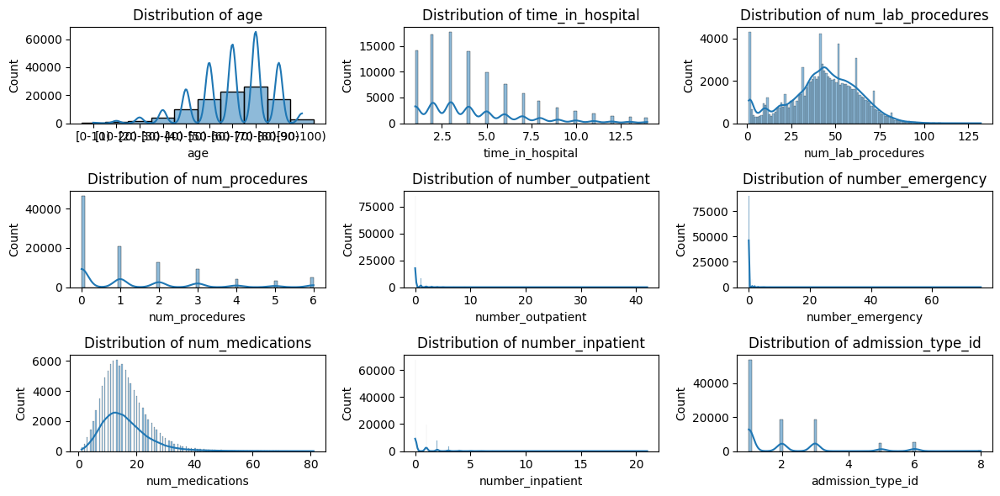

In [26]:
plt.figure(figsize=(12, 6))
for i, col in enumerate(numerical, 1):
    plt.subplot(3, 3, i)
    sns.histplot(diabetes_df_replaced[col], kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

In [27]:
diabetes_df_replaced[numerical].describe()

,time_in_hospital,num_lab_procedures,num_procedures,number_outpatient,number_emergency,num_medications,number_inpatient,admission_type_id
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,4.395987,43.095641,1.339730,0.369357,0.197836,16.021844,0.635566,2.024006
std,2.985108,19.674362,1.705807,1.267265,0.930472,8.127566,1.262863,1.445403
min,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,2.000000,31.000000,0.000000,0.000000,0.000000,10.000000,0.000000,1.000000
50%,4.000000,44.000000,1.000000,0.000000,0.000000,15.000000,0.000000,1.000000
75%,6.000000,57.000000,2.000000,0.000000,0.000000,20.000000,1.000000,3.000000
max,14.000000,132.000000,6.000000,42.000000,76.000000,81.000000,21.000000,8.000000


In [28]:
diabetes_df_replaced[categorical].describe()

,gender,race,readmitted,change
count,101766,99493,101766,101766
unique,3,5,3,2
top,Female,Caucasian,NO,No
freq,54708,76099,54864,54755


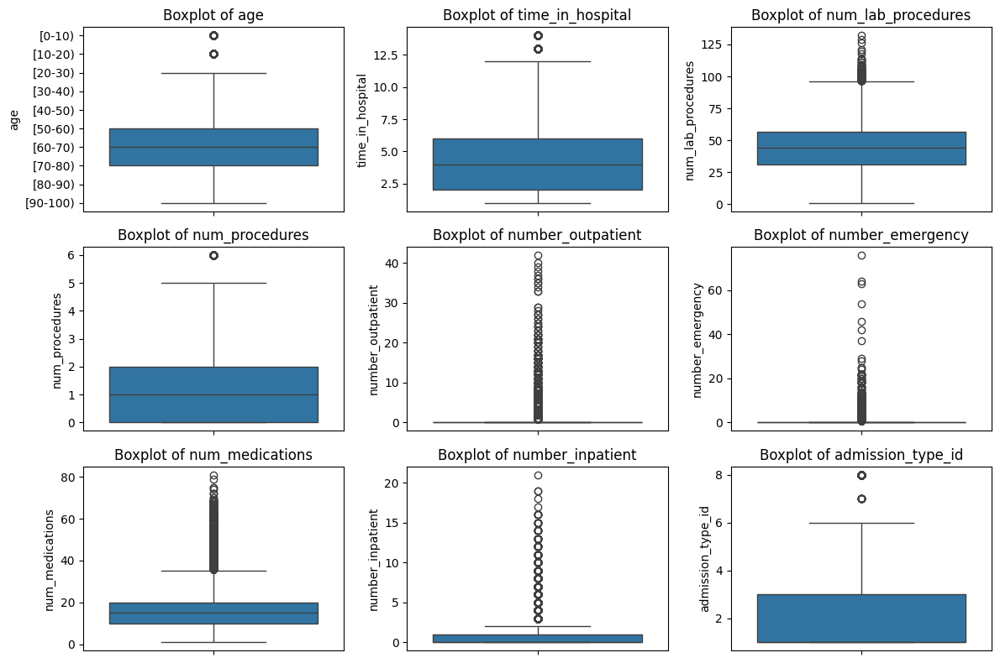

In [29]:
plt.figure(figsize=(12, 8))
for i, col in enumerate(numerical, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=diabetes_df_replaced[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

In [30]:
!pip install --upgrade --force-reinstall nbformat>=4.2.0
!pip install --upgrade plotly

In [31]:
print(f'{round(diabetes_df_replaced["gender"].value_counts(normalize=True)*100, 2)}%')
fig = px.histogram(diabetes_df_replaced, x="gender", title="Gender", width=400, height=300)
fig.show()

gender
Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: proportion, dtype: float64%


In [32]:
print(f'{round(diabetes_df_replaced["race"].value_counts(normalize=True)*100, 2)}%')
fig = px.histogram(diabetes_df_replaced, x="race", title="Race", width=400, height=300)
fig.show()

race
Caucasian          76.49
AfricanAmerican    19.31
Hispanic            2.05
Other               1.51
Asian               0.64
Name: proportion, dtype: float64%


In [33]:
print(f'{round(diabetes_df_replaced["readmitted"].value_counts(normalize=True)*100, 2)}%')
fig = px.histogram(diabetes_df_replaced, x="readmitted", title="Readmitted", width=400, height=300)
fig.show()

readmitted
NO     53.91
>30    34.93
<30    11.16
Name: proportion, dtype: float64%


In [34]:
print(f'{round(diabetes_df_replaced["change"].value_counts(normalize=True)*100, 2)}%')
fig = px.histogram(diabetes_df_replaced, x="change", title="Change", width=400, height=300)
fig.show()

change
No    53.8
Ch    46.2
Name: proportion, dtype: float64%


In [37]:
numerical_2 = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'number_outpatient', 'number_emergency', 'num_medications', 'number_inpatient', 'admission_type_id']

In [38]:
diabetes_df_replaced[numerical_2].corr()

,time_in_hospital,num_lab_procedures,num_procedures,number_outpatient,number_emergency,num_medications,number_inpatient,admission_type_id
time_in_hospital,1.000000,0.318450,0.191472,-0.008916,-0.009681,0.466135,0.073623,-0.012500
num_lab_procedures,0.318450,1.000000,0.058066,-0.007602,-0.002279,0.268161,0.039231,-0.143713
num_procedures,0.191472,0.058066,1.000000,-0.024819,-0.038179,0.385767,-0.066236,0.129888
number_outpatient,-0.008916,-0.007602,-0.024819,1.000000,0.091459,0.045197,0.107338,0.026511
number_emergency,-0.009681,-0.002279,-0.038179,0.091459,1.000000,0.013180,0.266559,-0.019116
num_medications,0.466135,0.268161,0.385767,0.045197,0.013180,1.000000,0.064194,0.079535
number_inpatient,0.073623,0.039231,-0.066236,0.107338,0.266559,0.064194,1.000000,-0.038161
admission_type_id,-0.012500,-0.143713,0.129888,0.026511,-0.019116,0.079535,-0.038161,1.000000


In [ ]:
diabetes_df_replaced[['time_in_hospital', ]]

In [43]:
fig = px.histogram(diabetes_df_replaced, x="gender", color="readmitted", title="Readmitted by gender", width=400, height=300)
fig.show()

In [44]:
fig = px.histogram(diabetes_df_replaced, x="age", color="readmitted", title="Readmitted by age", width=400, height=300)
fig.show()

In [51]:
fig = px.histogram(diabetes_df_replaced, x="race", color="readmitted", title="Readmitted by race", width=400, height=300)
fig.show()

In [50]:
fig = px.histogram(diabetes_df_replaced, x="race", color="gender", title="Gender breakdown by race", width=400, height=300)
fig.show()